In [1]:
import csv
import sys
import base64
import json
import os
import pickle
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import skimage
import cv2
from PIL import Image

In [27]:

cmap = matplotlib.cm.get_cmap('jet')
cmap.set_bad(color="k", alpha=0.0)

def attention_bbox_interpolation(im, bboxes, att):
    softmax = att
    assert len(softmax) == len(bboxes)

    img_h, img_w = im.shape[:2]
    opacity = np.zeros((img_h, img_w), np.float32)
    for bbox, weight in zip(bboxes, softmax):
        x1, y1, x2, y2 = bbox
        opacity[int(y1):int(y2), int(x1):int(x2)] += weight
    opacity = np.minimum(opacity, 1)

    opacity = opacity[..., np.newaxis]
    
    vis_im = np.array(Image.fromarray(cmap(opacity, bytes=True), 'RGBA'))
    vis_im = vis_im.astype(im.dtype)
    vis_im = cv2.addWeighted(im, 1, vis_im, 0.5, 0)
    vis_im = vis_im.astype(im.dtype)
    
    return vis_im


def attention_grid_interpolation(im, att):
    softmax = np.reshape(att, (14, 14))
    opacity = skimage.transform.resize(softmax, im.shape[:2], order=3)
    opacity = opacity[..., np.newaxis]
    opacity = opacity*0.95+0.05

    vis_im = opacity*im + (1-opacity)*255
    vis_im = vis_im.astype(im.dtype)
    return vis_im

def visualize_pred(im_path, boxes, att_weights):
    im = cv2.imread(im_path)
    im = cv2.cvtColor(im, cv2.COLOR_RGB2RGBA)
    b,g,r,a = cv2.split(im)           # get b, g, r
    im = cv2.merge([r,g,b,a])

    M = min(len(boxes), len(att_weights))
    im_ocr_att = attention_bbox_interpolation(im, boxes[:M], att_weights[:M])
    plt.imshow(im_ocr_att)
    plt.axis('off')
#     plt.savefig('paper/1.png')

In [ ]:
# imdb_ori = np.load('data/imdb/imdb_val2014.npy',allow_pickle=True) 
# imdb_imps = 

In [3]:
# load generated attention maps
att_1 = np.load('boards/pythia_cycle_consistent/3012/gq_50000.npy',allow_pickle=True).item()
att_2 = np.load('boards/pythia_cycle_consistent/3012/gq_55000.npy',allow_pickle=True).item()

att_3 = np.load('boards/default/30/gq_50000.npy',allow_pickle=True).item()
att_4 = np.load('boards/default/30/gq_55000.npy',allow_pickle=True).item()

In [4]:
# map implications to its question id

map_12 = {}
    
for i,a in enumerate(att_2['ques_answers']): 
    if a['ques_id'] not in map_12:
        map_12[a['ques_id']] = [i]
    else:
        map_12[a['ques_id']].append(i)
        
map_34 = {}

for i,a in enumerate(att_4['ques_answers']): 
    if a['ques_id'] not in map_34:
        map_34[a['ques_id']] = [i]
    else:
        map_34[a['ques_id']].append(i)

In [ ]:
#bbox file
file = os.listdir('check_bbox/val2014')[0]
print(file)
feat = np.load('check_bbox/val2014/'+file,allow_pickle=True).item()
image_bboxes = np.frombuffer(base64.b64decode(feat['boxes']),dtype=np.float32).reshape((feat['num_boxes'], -1))

im_path = 'orig_data/vqa_v2.0/val2014/' +  file[:-4] +'.jpg'

In [ ]:
# all questions on that image 
indexes = []
for i,a in enumerate(att_1['ques_answers']): 
    if a['image_id'] == feat['image_id']:
        indexes.append(i)

# showing results on our model
for idx in indexes:
    
    a = att_1['ques_answers'][idx]
    visualize_pred(im_path,image_bboxes,a['attention'])
    plt.show()
    print('Question: {} ? Ans: {}'.format(a['orig_ques'],a['orig_ans']))
    
    for i in map_12[a['ques_id']]:
        aimp = att_2['ques_answers'][i]
        visualize_pred(im_path,image_bboxes,aimp['attention'])
        plt.show()
        print('Question: {} ? Ans: {}'.format(aimp['orig_ques'],aimp['orig_ans']))
    
    print('='*100)

In [ ]:
# all questions on that image 
indexes = []
for i,a in enumerate(att_3['ques_answers']): 
    if a['image_id'] == feat['image_id']:
        indexes.append(i)

# showing results on baseline
for idx in indexes:
    
    a = att_3['ques_answers'][idx]
    visualize_pred(im_path,image_bboxes,a['attention'])
    plt.show()
    print('Question: {} ? Ans: {}'.format(a['orig_ques'],a['orig_ans']))
    
    for i in map_34[a['ques_id']]:
        aimp = att_4['ques_answers'][i]
        visualize_pred(im_path,image_bboxes,aimp['attention'])
        plt.show()
        print('Question: {} ? Ans: {}'.format(aimp['orig_ques'],aimp['orig_ans']))
    
    print('='*100)

## paper visuals

In [5]:
question_ids_12 = set()

for a1 in att_1['ques_answers']:
    qid = a1['ques_id']
    if a1['orig_ans'] == a1['pred_ans'] and qid in map_12 and len(map_12[qid]) == 3:
        flag = 0
        for _i in map_12[qid]:
            a2 = att_2['ques_answers'][_i]
            if a2['orig_ans'] == a2['pred_ans']:
                flag += 1
        if flag==3:
            question_ids_12.add(qid)

question_ids_34 = set()
for a3 in att_3['ques_answers']:
    qid = a3['ques_id']
    if a3['orig_ans'] == a3['pred_ans'] and qid in map_34 and len(map_34[qid]) == 3:
        flag = 0
        for _i in map_34[qid]:
            a4 = att_4['ques_answers'][_i]
            if a4['orig_ans'] == a4['pred_ans']:
                flag+=1
        if flag==0:
            question_ids_34.add(qid)
            
qids = list(question_ids_34.intersection(question_ids_12))
len(qids)

99

In [6]:
import random

In [31]:
_qids = [319423001,43939005,548095001,247378008,81361001,462011000,
         120783002,172319001,56701004, 398798003, 269172001]

319423001
showing results on our model


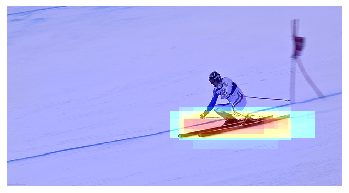

Question: what color are the skiis <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: black orig ans: black


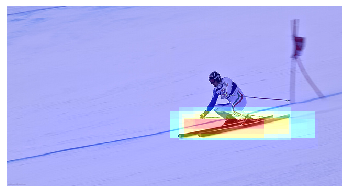

Question: are the skiis black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


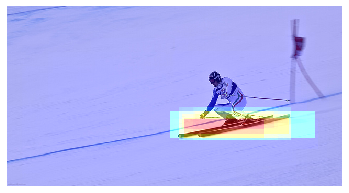

Question: are the skiis white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


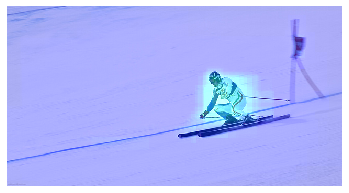

Question: is there anything black in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


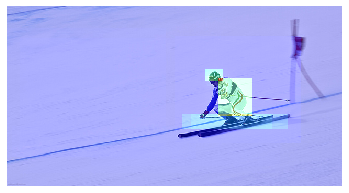

Question: what color are the skiis <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: black orig ans: black


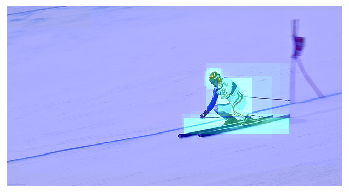

Question: are the skiis black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


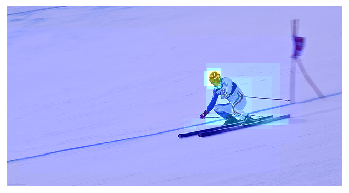

Question: are the skiis white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


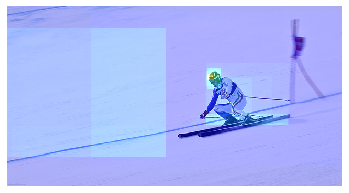

Question: is there anything black in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
43939005
showing results on our model


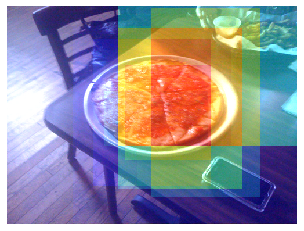

Question: how many pizzas are on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 1 orig ans: 1


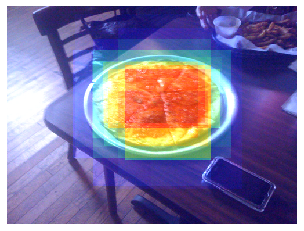

Question: is 1 pizza on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


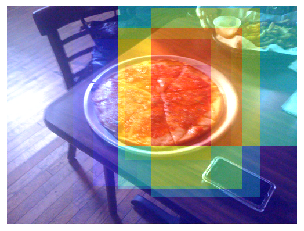

Question: are 2 pizzas on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


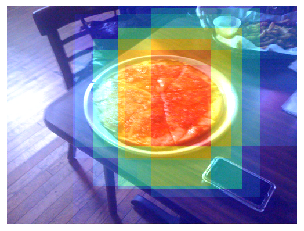

Question: are any pizzas on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


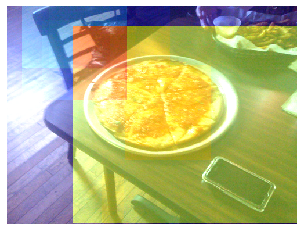

Question: how many pizzas are on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 1 orig ans: 1


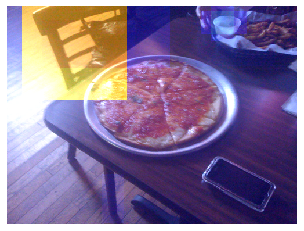

Question: is 1 pizza on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


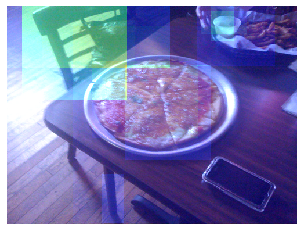

Question: are 2 pizzas on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


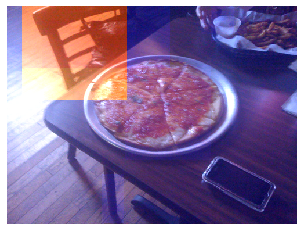

Question: are any pizzas on the table <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 1 orig ans: yes
548095001
showing results on our model


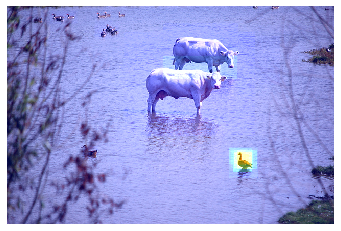

Question: what kind of bird is there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: duck orig ans: duck


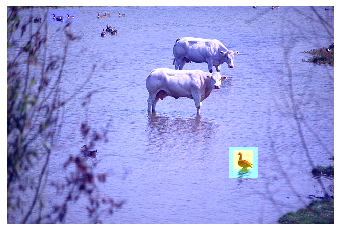

Question: is there a duck <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


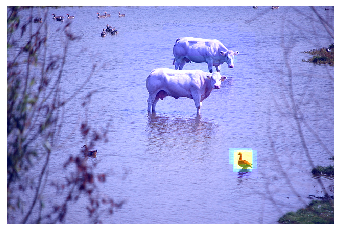

Question: is there a goose <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


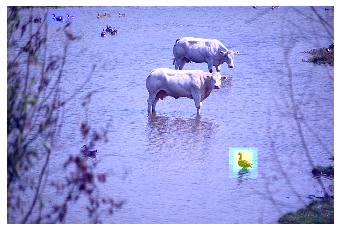

Question: is there a duck in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


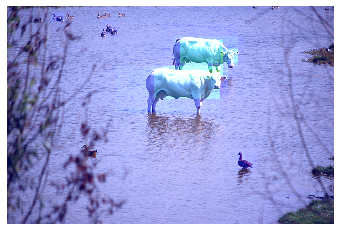

Question: what kind of bird is there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: duck orig ans: duck


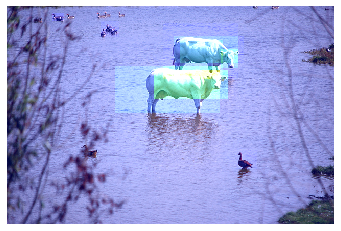

Question: is there a duck <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


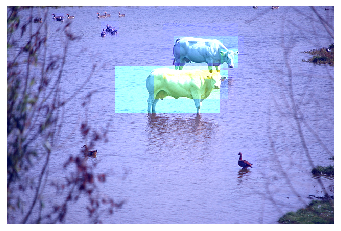

Question: is there a goose <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


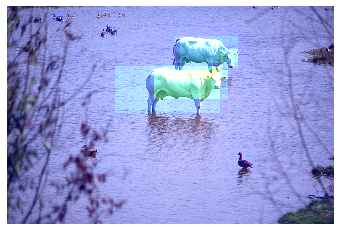

Question: is there a duck in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
247378008
showing results on our model


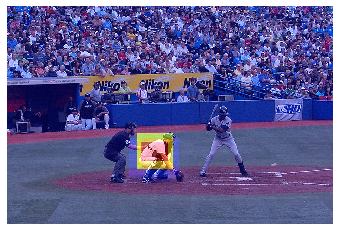

Question: what color is the catchers jersey <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: white orig ans: white


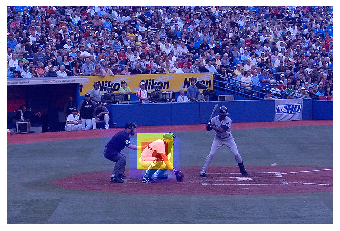

Question: is the catchers jersey white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


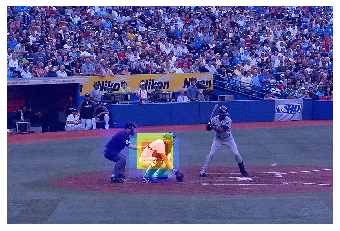

Question: is the catchers jersey black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


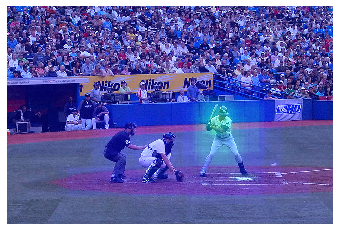

Question: is there anything white in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


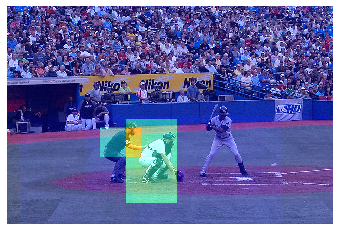

Question: what color is the catchers jersey <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: white orig ans: white


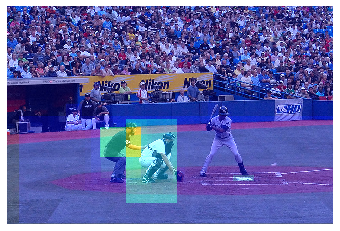

Question: is the catchers jersey white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


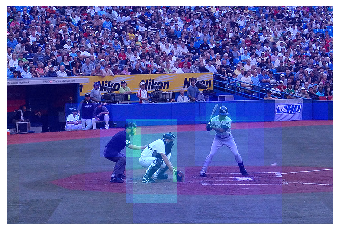

Question: is the catchers jersey black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


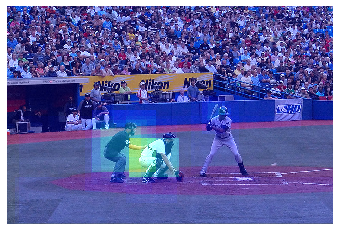

Question: is there anything white in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
81361001
showing results on our model


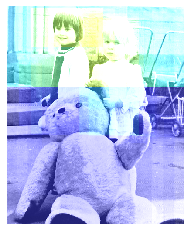

Question: how many kids are there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 2 orig ans: 2


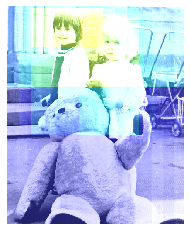

Question: are there 2 kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


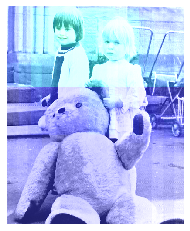

Question: are there 3 kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


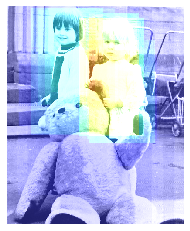

Question: are there any kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


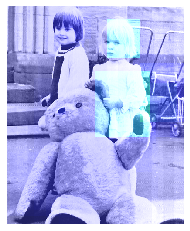

Question: how many kids are there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 2 orig ans: 2


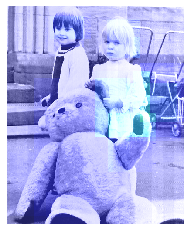

Question: are there 2 kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


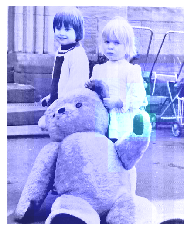

Question: are there 3 kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


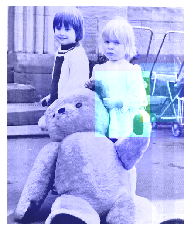

Question: are there any kids <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
462011000
showing results on our model


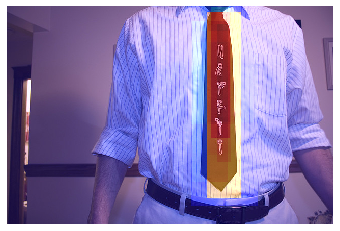

Question: what color is his tie <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: black orig ans: black


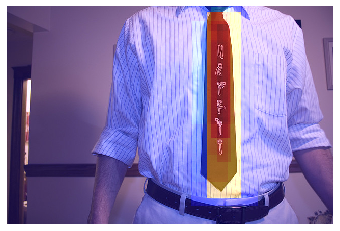

Question: is his tie black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


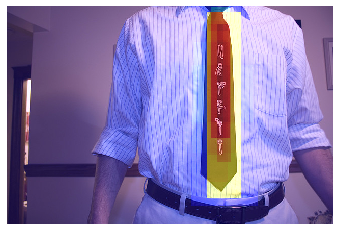

Question: is his tie white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


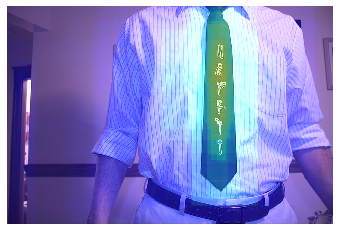

Question: is there anything black in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


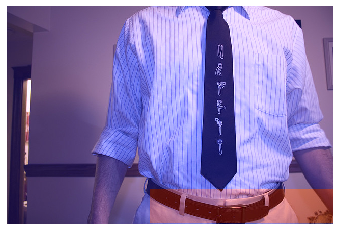

Question: what color is his tie <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: black orig ans: black


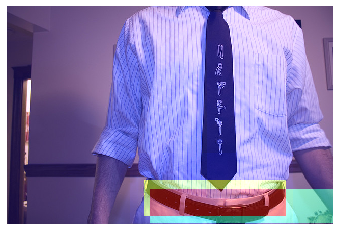

Question: is his tie black <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


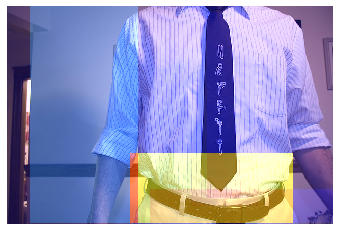

Question: is his tie white <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


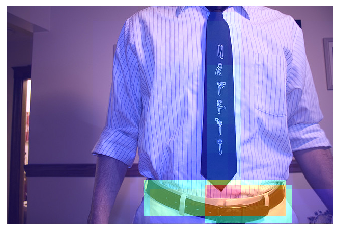

Question: is there anything black in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
120783002
showing results on our model


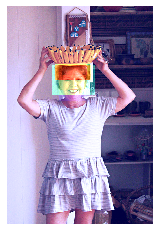

Question: what color is the lady ' s hair <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: brown orig ans: brown


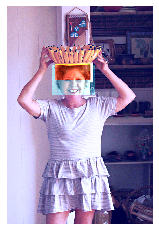

Question: is the lady ' s hair brown <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


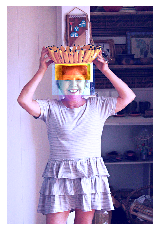

Question: is the lady ' s hair pink <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


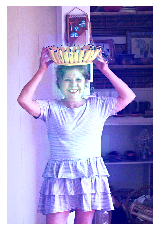

Question: is there anything brown in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


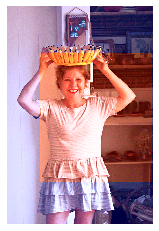

Question: what color is the lady ' s hair <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: red orig ans: red


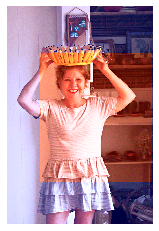

Question: is the lady ' s hair brown <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


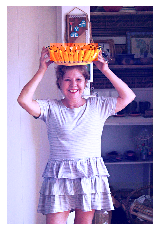

Question: is the lady ' s hair pink <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


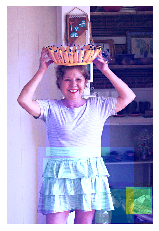

Question: is there anything brown in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes
172319001
showing results on our model


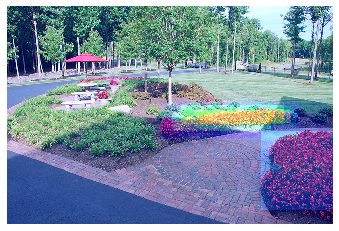

Question: what color are the flowers in the garden <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: red orig ans: red


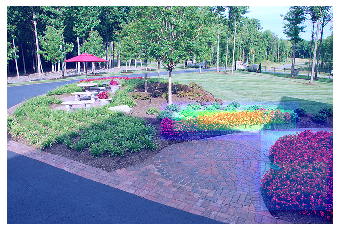

Question: are the flowers in the garden red <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


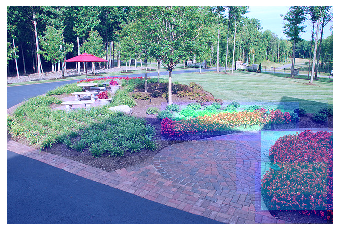

Question: are the flowers in the garden green <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


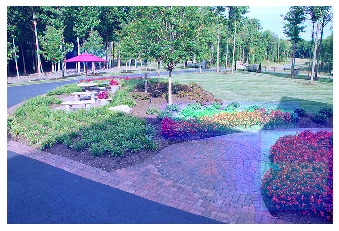

Question: is there anything red in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


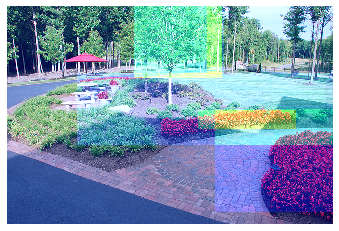

Question: what color are the flowers in the garden <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: red orig ans: red


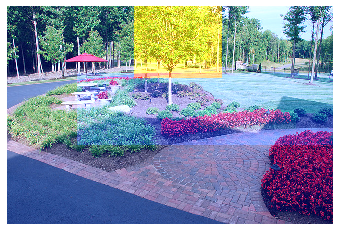

Question: are the flowers in the garden red <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


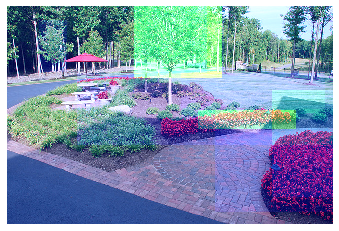

Question: are the flowers in the garden green <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


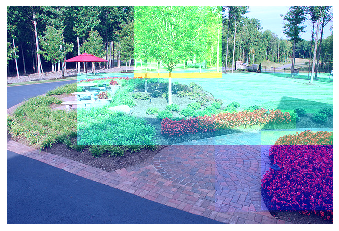

Question: is there anything red in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
56701004
showing results on our model


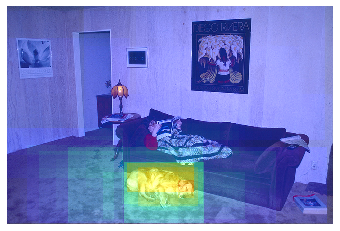

Question: how many dogs are there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 1 orig ans: 1


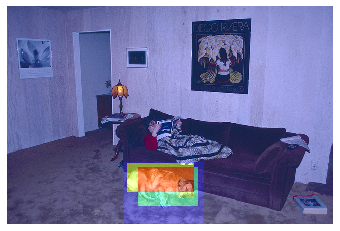

Question: is there 1 dog <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


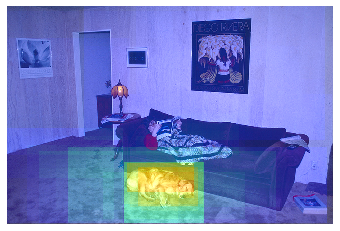

Question: are there 2 dogs <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


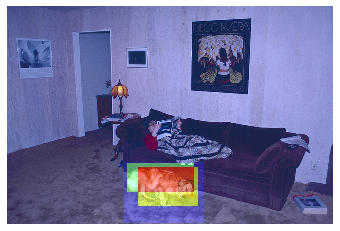

Question: are there any dogs <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


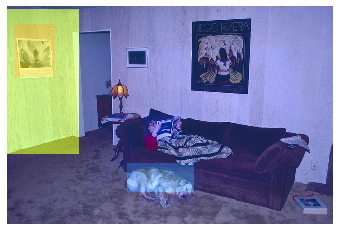

Question: how many dogs are there <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: 1 orig ans: 1


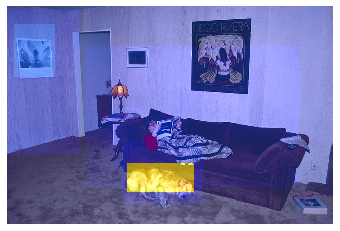

Question: is there 1 dog <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


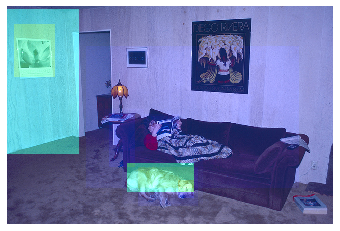

Question: are there 2 dogs <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


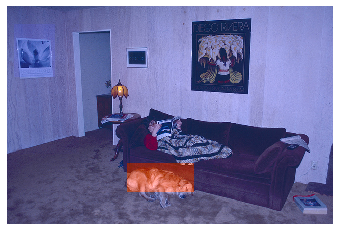

Question: are there any dogs <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
398798003
showing results on our model


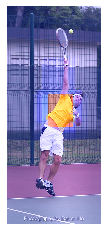

Question: what color is the man ' s shirt <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yellow orig ans: yellow


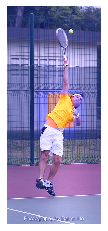

Question: is the man ' s shirt yellow <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


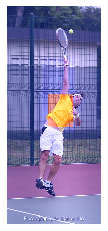

Question: is the man ' s shirt violet <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: no


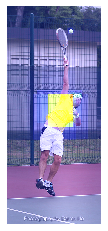

Question: is there anything yellow in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


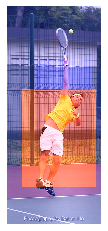

Question: what color is the man ' s shirt <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yellow orig ans: yellow


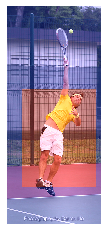

Question: is the man ' s shirt yellow <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


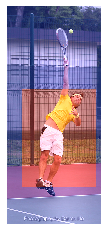

Question: is the man ' s shirt violet <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


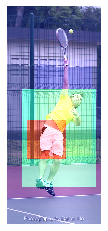

Question: is there anything yellow in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
269172001
showing results on our model


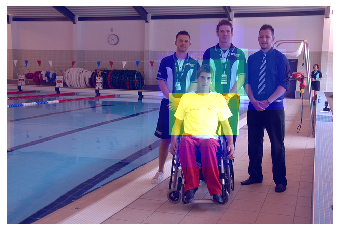

Question: what color shirt does the person closest to the camera wear <unk> <unk> <unk> ? pred ans: white orig ans: white


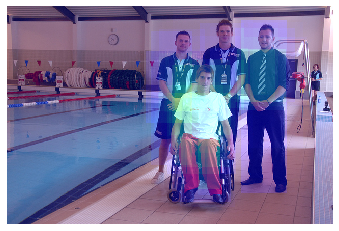

Question: does the person closest to the camera wear white <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


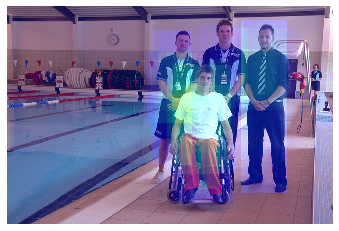

Question: does the person closest to the camera wear black <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


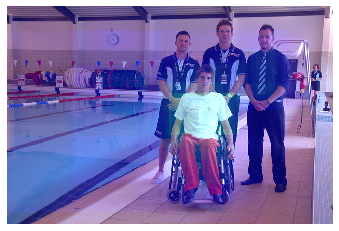

Question: is there anything white in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes
showing results on our baseline


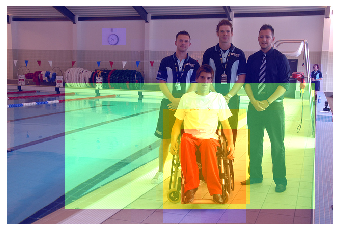

Question: what color shirt does the person closest to the camera wear <unk> <unk> <unk> ? pred ans: white orig ans: white


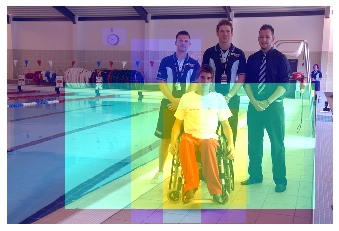

Question: does the person closest to the camera wear white <unk> <unk> <unk> <unk> <unk> ? pred ans: no orig ans: yes


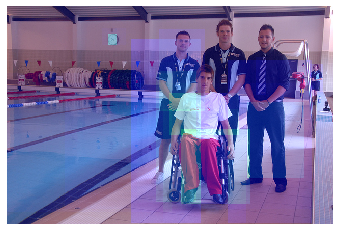

Question: does the person closest to the camera wear black <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: no


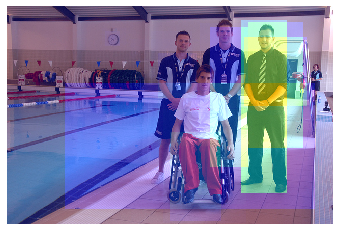

Question: is there anything white in the picture <unk> <unk> <unk> <unk> <unk> <unk> <unk> ? pred ans: yes orig ans: yes


In [33]:
qas = {}
for qid in _qids:
    print('='*100)
    print(qid)
    qas[qid] = []
    image_id = int(qid/1000)
    file = 'COCO_val2014_'+str(image_id).zfill(12)+'.npy'

    feat = np.load('check_bbox/val2014/'+file,allow_pickle=True).item()
    image_bboxes = np.frombuffer(base64.b64decode(feat['boxes']),dtype=np.float32).reshape((feat['num_boxes'], -1))

    im_path = 'orig_data/vqa_v2.0/val2014/' +  file[:-4] +'.jpg'

    for i,a in enumerate(att_1['ques_answers']): 
        if a['ques_id'] == qid:
            idx = i
            break

    print('showing results on our model')
    a = att_1['ques_answers'][idx]
    visualize_pred(im_path,image_bboxes,a['attention'])
    plt.savefig('paper/{}_1.png'.format(qid))
    plt.show()
    print('Question: {} ? pred ans: {} orig ans: {}'.format(a['orig_ques'],a['pred_ans'],a['orig_ans']))
    qas[qid].append('Question: {} ? pred ans: {} orig ans: {}'.format(a['orig_ques'],a['pred_ans'],a['orig_ans']))
    
    for c,i in enumerate(map_12[a['ques_id']]):
        aimp = att_2['ques_answers'][i]
        visualize_pred(im_path,image_bboxes,aimp['attention'])
        plt.savefig('paper/{}_1_{}.png'.format(qid,c))
        plt.show()
        print('Question: {} ? pred ans: {} orig ans: {}'.format(aimp['orig_ques'],aimp['pred_ans'],aimp['orig_ans']))
        qas[qid].append('Question: {} ? pred ans: {} orig ans: {}'.format(aimp['orig_ques'],aimp['pred_ans'],aimp['orig_ans']))
    
    print('showing results on our baseline')
    a = att_3['ques_answers'][idx]
    visualize_pred(im_path,image_bboxes,a['attention'])
    plt.savefig('paper/{}_2.png'.format(qid))
    plt.show()
    print('Question: {} ? pred ans: {} orig ans: {}'.format(a['orig_ques'],a['pred_ans'],a['orig_ans']))
    qas[qid].append('Question: {} ? pred ans: {} orig ans: {}'.format(a['orig_ques'],a['pred_ans'],a['orig_ans']))
    for c,i in enumerate(map_34[a['ques_id']]):
        aimp = att_4['ques_answers'][i]
        visualize_pred(im_path,image_bboxes,aimp['attention'])
        plt.savefig('paper/{}_2_{}.png'.format(qid,c))
        plt.show()
        print('Question: {} ? pred ans: {} orig ans: {}'.format(aimp['orig_ques'],aimp['pred_ans'],aimp['orig_ans']))
        qas[qid].append('Question: {} ? pred ans: {} orig ans: {}'.format(aimp['orig_ques'],aimp['pred_ans'],aimp['orig_ans']))

In [ ]:
json.dump(qas,open('paper/qas.json','w'))

# Playground

In [ ]:

csv.field_size_limit(sys.maxsize)

FIELDNAMES = ["img_id", "img_h", "img_w", "objects_id", "objects_conf",
              "attrs_id", "attrs_conf", "num_boxes", "boxes", "features"]

infile = '/home1/BTP/pg_aa_1/data/mscoco_imgfeat/val2014_obj36.tsv'

In [ ]:

with open(infile, "r") as tsv_in_file:
    reader = csv.DictReader(tsv_in_file, delimiter='\t', fieldnames=FIELDNAMES)
    for item in reader:
#         item['num_boxes'] = int(item['num_boxes'])
        print(item['img_id'],item['img_w'], item['img_h'], item['num_boxes'])
        item['num_boxes'] = int(item['num_boxes'])
        image_bboxes = np.frombuffer(
            base64.b64decode(item['boxes']),
            dtype=np.float32).reshape((item['num_boxes'], -1))
        print(image_bboxes)
        break

In [ ]:
feat = np.load('data/rcnn_10_100/vqa/val2014/' +  item['img_id'] +'.npy',allow_pickle=True)